In [24]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv

In [3]:
x_test = np.load('x_test.npy')
y_test = np.load('../y_test.npy')
print(x_test.shape)
print(y_test.shape)

(10000, 32, 32, 3)
(10000,)


In [4]:
x_test_normalize = x_test / 255
print('normalize done.')

normalize done.


In [5]:
from keras.utils import np_utils
y_test_onehot = np_utils.to_categorical(y_test)
print('onehot done.')

/Users/DannyShau/anaconda/envs/py3.6/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


onehot done.


In [8]:
from keras.models import load_model
model = load_model('../channel3_size32/models/alexnet.h5')
print('model load.')

model load.


In [9]:
scores = model.evaluate(x_test_normalize, y_test_onehot, verbose = 0)
print(scores)

[0.6808265241622925, 0.8146]


In [33]:
y_predict = []
for i in x_test_normalize:
    i = i.reshape(1, 32, 32, 3)
    y_probability = model.predict(i)
    y_class = y_probability.argmax()
    y_predict.append(y_class)

In [42]:
label = []
predict = []
position = []
for i, j in zip(y_predict, enumerate(y_test)):
    if i == j[1]:
        pass
    else:
        predict.append(i)
        position.append(j[0])
        label.append(j[1])        

In [16]:
def img_load(path):
    img = cv.imread(path)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)    
    return img

In [17]:
def img_show(img):
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

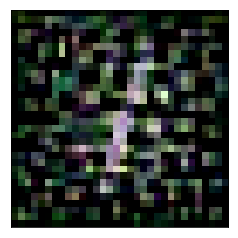

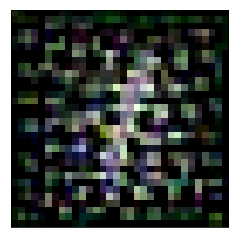

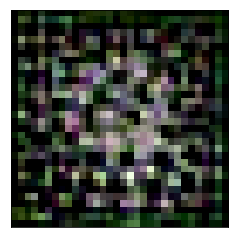

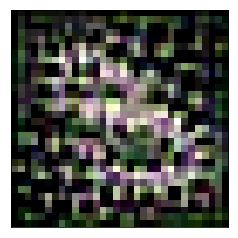

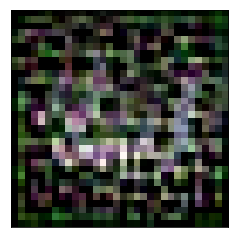

...

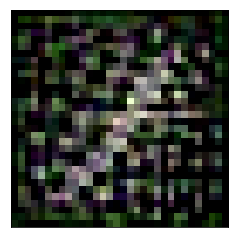

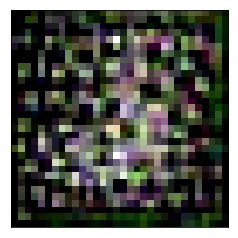

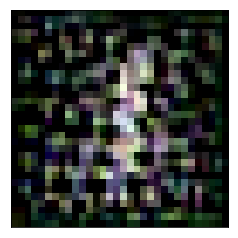

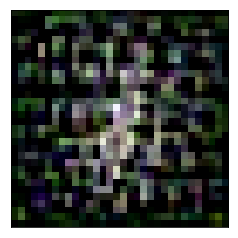

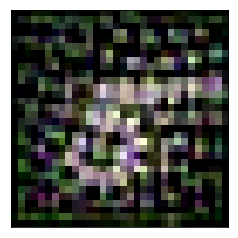

In [49]:
for i in position:
    path = 'x_test/%s.png' % str(i)
    img = img_load(path)
    img_show(img)